In [1]:
# !pip install prophet

In [2]:
# !pip install torch

In [3]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns
import warnings
from statsmodels.tsa.deterministic  import DeterministicProcess, CalendarFourier
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import AdaBoostRegressor
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from prophet import Prophet
import torch
from torch import nn
import torch.nn.functional as F
from sklearn.metrics import r2_score
from sklearn.multioutput import MultiOutputRegressor

warnings.filterwarnings('ignore')


## importing the preprocessed data from phase 1

In [5]:
df = pd.read_csv('train_check.csv')
df['Order Date'] = pd.to_datetime(df['Order Date'], format = '%d/%m/%Y')
df['month'] = pd.to_datetime(df['Order Date']).dt.to_period('M')
df.head()

,Row ID,Order ID,Order Date,Ship Date,Ship Mode,Customer ID,Customer Name,Segment,Country,City,State,Postal Code,Region,Product ID,Category,Sub-Category,Product Name,Sales,month
0,1,CA-2017-152156,2017-11-08,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-BO-10001798,Furniture,Bookcases,Bush Somerset Collection Bookcase,261.9600,2017-11
1,2,CA-2017-152156,2017-11-08,11/11/2017,Second Class,CG-12520,Claire Gute,Consumer,United States,Henderson,Kentucky,42420.0,South,FUR-CH-10000454,Furniture,Chairs,"Hon Deluxe Fabric Upholstered Stacking Chairs,...",731.9400,2017-11
2,3,CA-2017-138688,2017-06-12,16/06/2017,Second Class,DV-13045,Darrin Van Huff,Corporate,United States,Los Angeles,California,90036.0,West,OFF-LA-10000240,Office Supplies,Labels,Self-Adhesive Address Labels for Typewriters b...,14.6200,2017-06
3,4,US-2016-108966,2016-10-11,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,FUR-TA-10000577,Furniture,Tables,Bretford CR4500 Series Slim Rectangular Table,957.5775,2016-10
4,5,US-2016-108966,2016-10-11,18/10/2016,Standard Class,SO-20335,Sean O'Donnell,Consumer,United States,Fort Lauderdale,Florida,33311.0,South,OFF-ST-10000760,Office Supplies,Storage,Eldon Fold 'N Roll Cart System,22.3680,2016-10


## Analyzing trends for time series analysis

In [7]:
# plotting the trends for every column with sales to see the relation

In [8]:
def plot_trend_group(group,size, color='blue'):
    sales_by_group = df.groupby(group)['Sales'].sum() # group sales by group
    sales_by_group.sort_values(ascending= False, inplace=True) # sort values
    sales_by_group.head(size) 
    fig, axes = plt.subplots(int(size/3),3, figsize=(15,size), sharex =True, sharey =True)
    fig.suptitle('Sales trend by {}'.format(group), fontsize=18)
    for ax,group_name in zip(axes.flat, sales_by_group.index):
        sales_group = df[df[group]==group_name]
        sales_group = sales_group.groupby('month')['Sales'].sum()
        sales_group.index = sales_group.index.to_timestamp()
        ax.tick_params(labelrotation=45)
        ax.set_title(group_name, fontsize = 10)
        ax.plot(sales_group, color=color)
    fig.tight_layout()
    save_path = '{}_sales_trend.png'.format(group)
    plt.savefig(save_path, bbox_inches='tight', dpi=300) 
    plt.show()

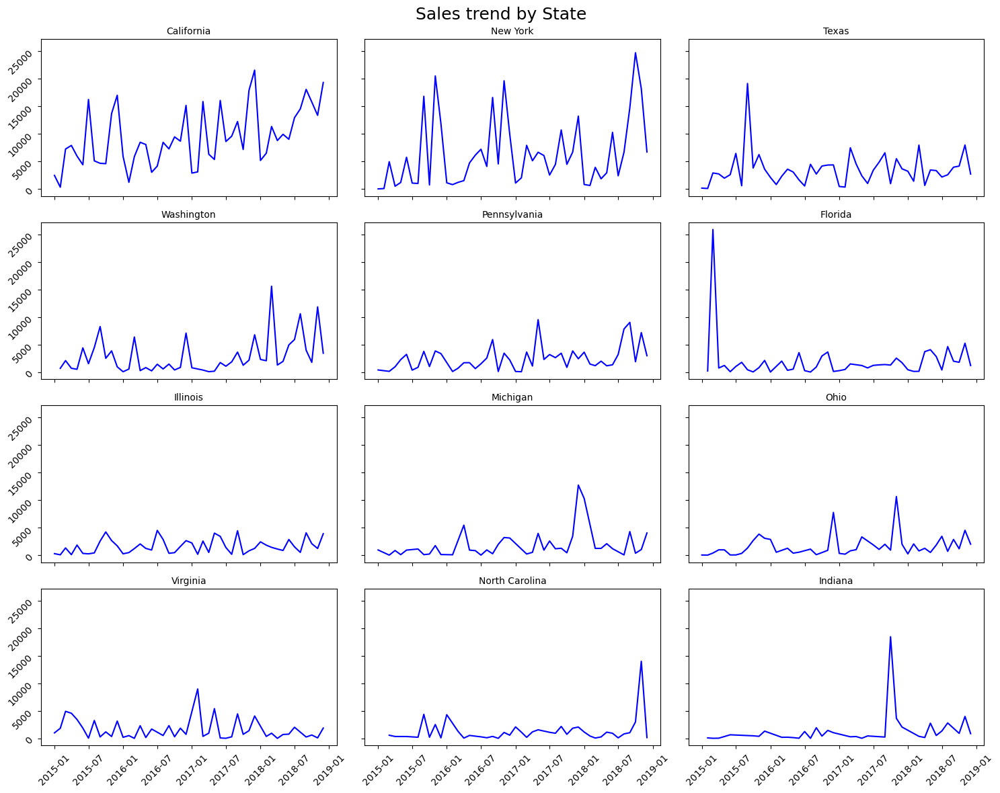

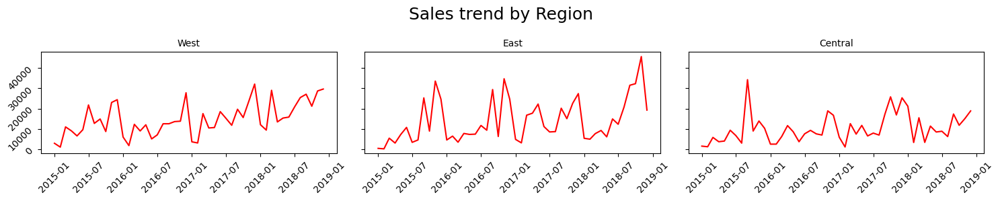

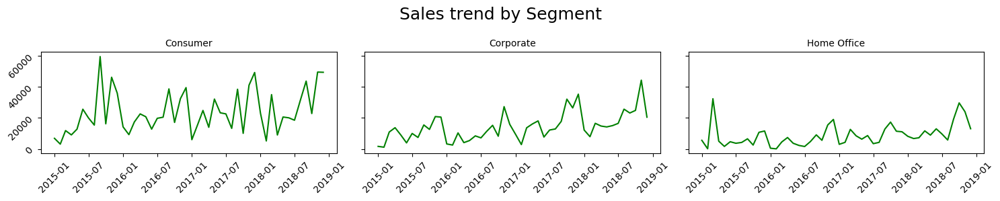

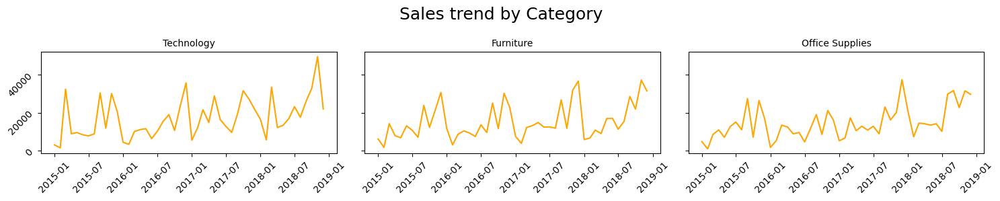

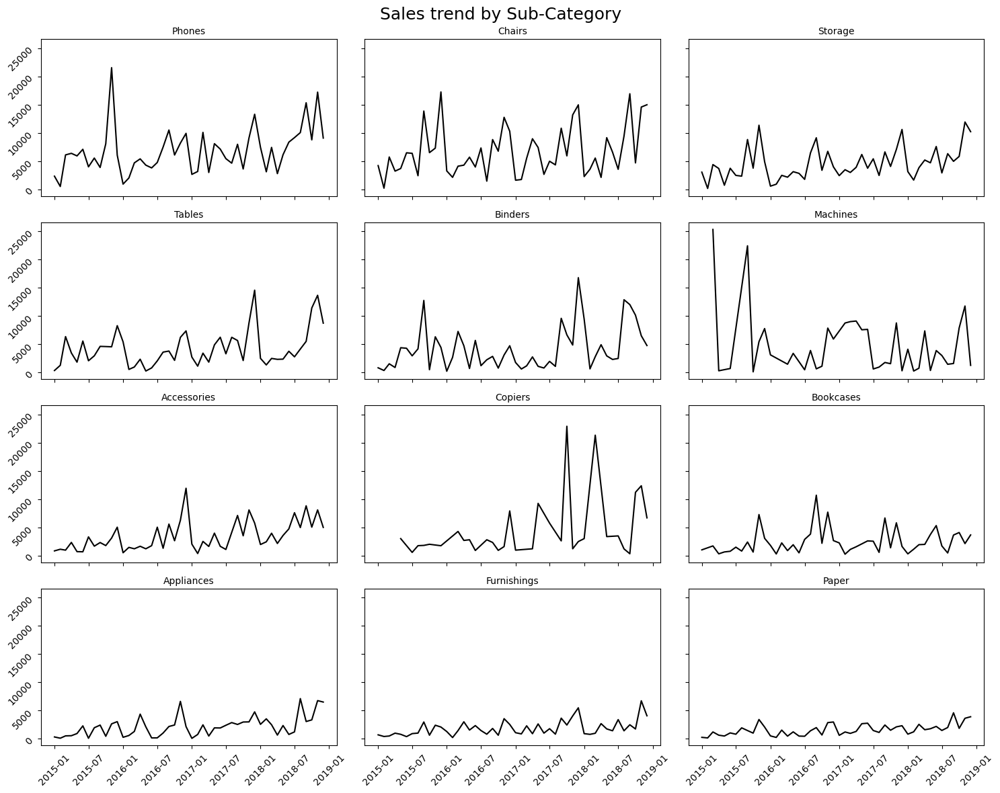

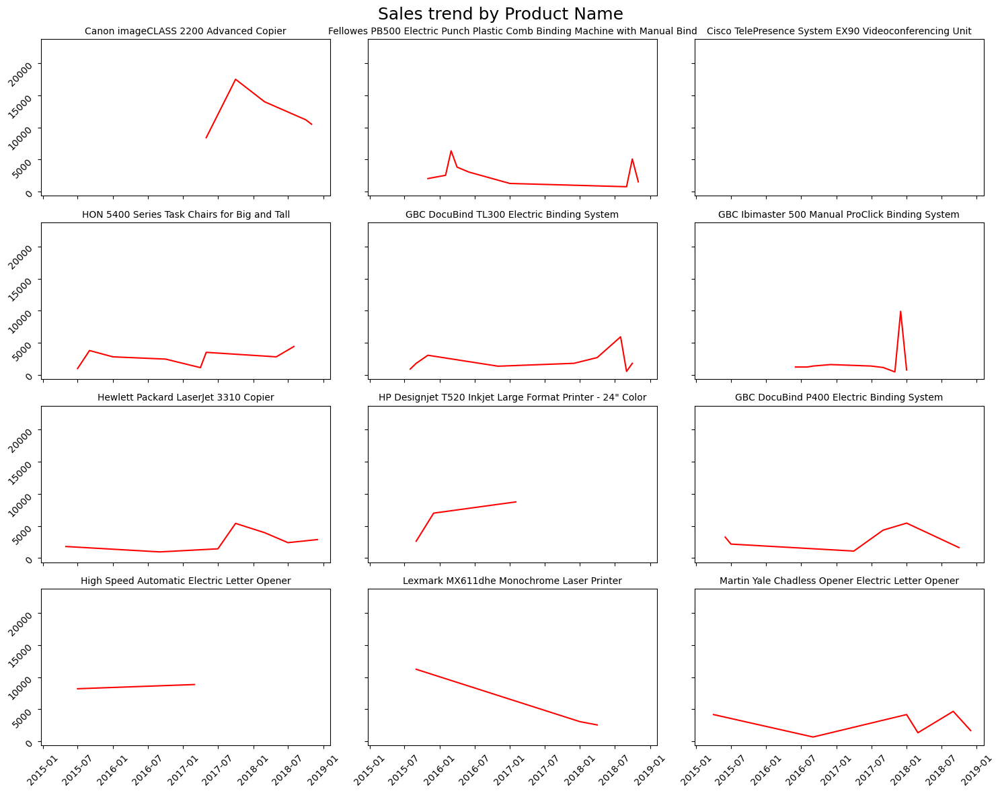

In [9]:
plot_trend_group('State',12)
plot_trend_group('Region',3, 'red') 
plot_trend_group('Segment',3,'green') 
plot_trend_group('Category',3, 'orange') 
plot_trend_group('Sub-Category',12, 'black') 
plot_trend_group('Product Name',12,'red')

In [10]:
# inference from the above trends
# 1. sales show different seasonality and trends for different states
# 2. Different regions show similiar trend
# 3. even categories show similar trend
# 4. But sub categories show diffrent trends and seasonality 

In [11]:
# it is clear that we are moving into time series analysis

In [12]:
# let us create a dataframe where the sales of the whole month is summed together

In [13]:
monthly_sales = df.groupby('month')['Sales'].sum()
monthly_sales = pd.DataFrame(monthly_sales)
monthly_sales['time'] = np.arange(len(monthly_sales.index))
monthly_sales.head(14)

,Sales,time
month,,
2015-01,14205.7070,0
2015-02,4519.8920,1
2015-03,55205.7970,2
2015-04,27906.8550,3
2015-05,23644.3030,4
2015-06,34322.9356,5
2015-07,33781.5430,6
2015-08,27117.5365,7
2015-09,81623.5268,8


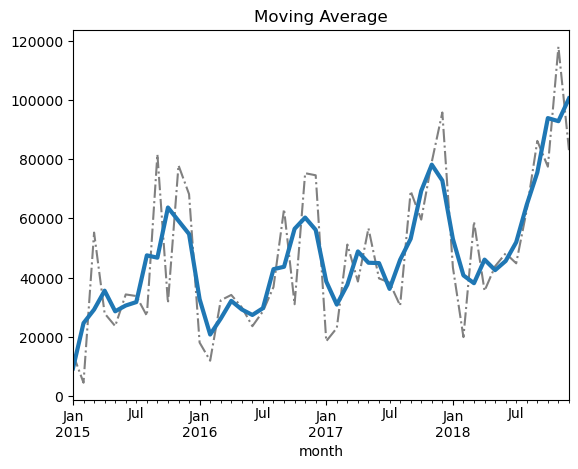

In [14]:
moving_average = monthly_sales['Sales'].rolling(window = 3, center = True, min_periods=1).mean()
moving_average
ax =monthly_sales['Sales'].plot(style="-.", color="0.5")
ax.set_title('Moving Average');
moving_average.plot( ax =ax, linewidth=3);


In [15]:
# we check with which order of linear regression fits for our monthly analysis

In [16]:
def plot_trend(order=1):
    sns.set_style('whitegrid')
    plt.rc('figure', autolayout = True, figsize= (13,4), titlesize = 18, titleweight = 'bold')
    plt.rc("axes", labelweight="bold", labelsize="large", titleweight="bold",titlesize=16,titlepad=10)
    %config InlineBackend.figure_format = 'retina'
    fig, ax = plt.subplots()
    ax.plot(monthly_sales['time'], monthly_sales['Sales'], color='0.75')
    ax = sns.regplot(data=monthly_sales, x='time', y='Sales', scatter_kws=dict(color='0.25'), order=order)
    ax.set_title('Monthly Sales with Order {} regression'.format(order));
    plt.savefig('Monthly Sales with Order {} regression'.format(order), bbox_inches='tight', dpi=300)

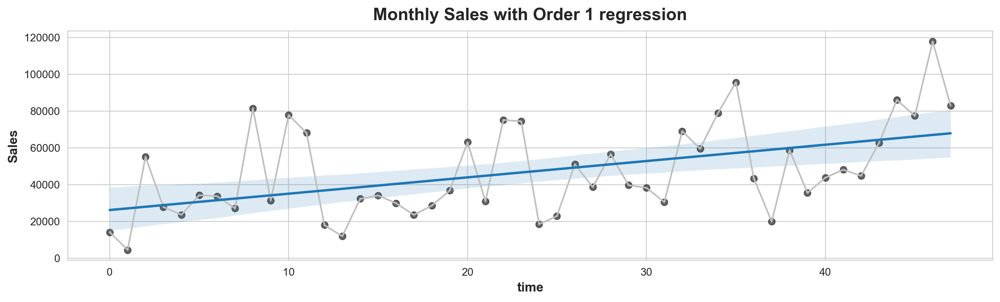

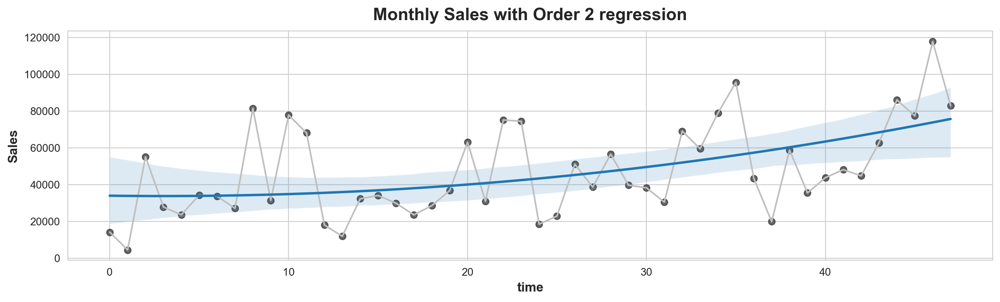

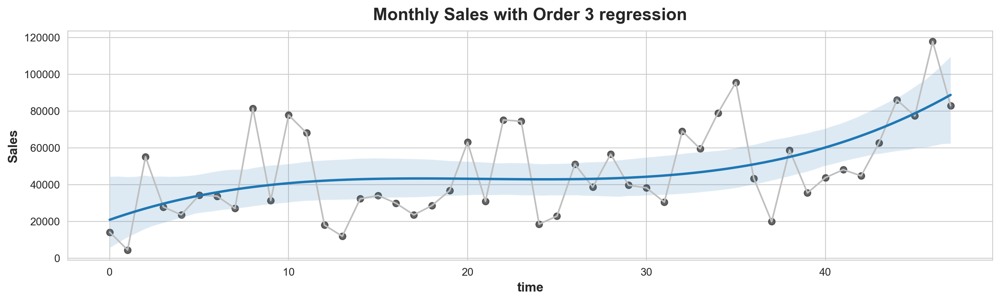

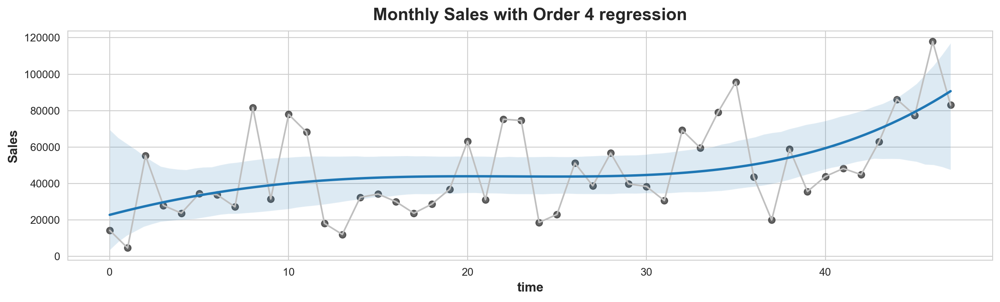

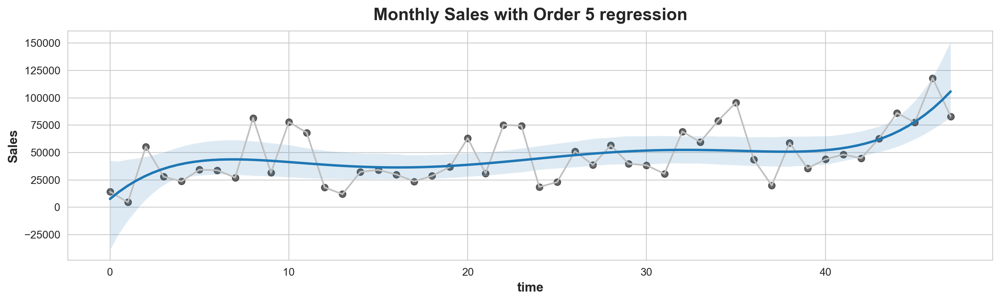

In [17]:
for order in range(1,6):
    plot_trend(order)

In [18]:
# we found there are some orders of regression that are close to the true data points

In [19]:
# in order to find seasonality and trend clearly in the selected month feature with sales we can use moving average

In [20]:
# we can see there are some repeated patterns (seasonality) and the trend is going upwards overall, indicating sales are increasing

In [21]:
#now we will sample a new dataset to account for this seasonality and trend, so while the model is training, it can capture those for 
#helping future predictions

#also we know that, for time series analyis, we need past data to predict future data, so for a correct prediction a sampling of the month v.s 
#sales data is required for a proper model training

# we used statsmodel to create a sample to add features for seasonality and trend

## Sampling of the data

In [23]:
fourier = CalendarFourier(freq = 'ME', order =4)

In [24]:
dp = DeterministicProcess(
    index=monthly_sales.index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=2,             # the time dummy (trend)
    additional_terms = [fourier],
    seasonal =True,
    drop=True,         
)

In [25]:
#url link for the above setting - https://www.statsmodels.org/stable/_modules/statsmodels/tsa/deterministic.html#DeterministicProcess

In [26]:
X = dp.in_sample()
X.head(13)

,const,trend,trend_squared,"s(2,12)","s(3,12)","s(4,12)","s(5,12)","s(6,12)","s(7,12)","s(8,12)","s(9,12)","s(10,12)","s(11,12)","s(12,12)"
month,,,,,,,,,,,,,,
2015-01,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-02,1.0,2.0,4.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-03,1.0,3.0,9.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-04,1.0,4.0,16.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-05,1.0,5.0,25.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-06,1.0,6.0,36.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
2015-07,1.0,7.0,49.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2015-08,1.0,8.0,64.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
2015-09,1.0,9.0,81.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


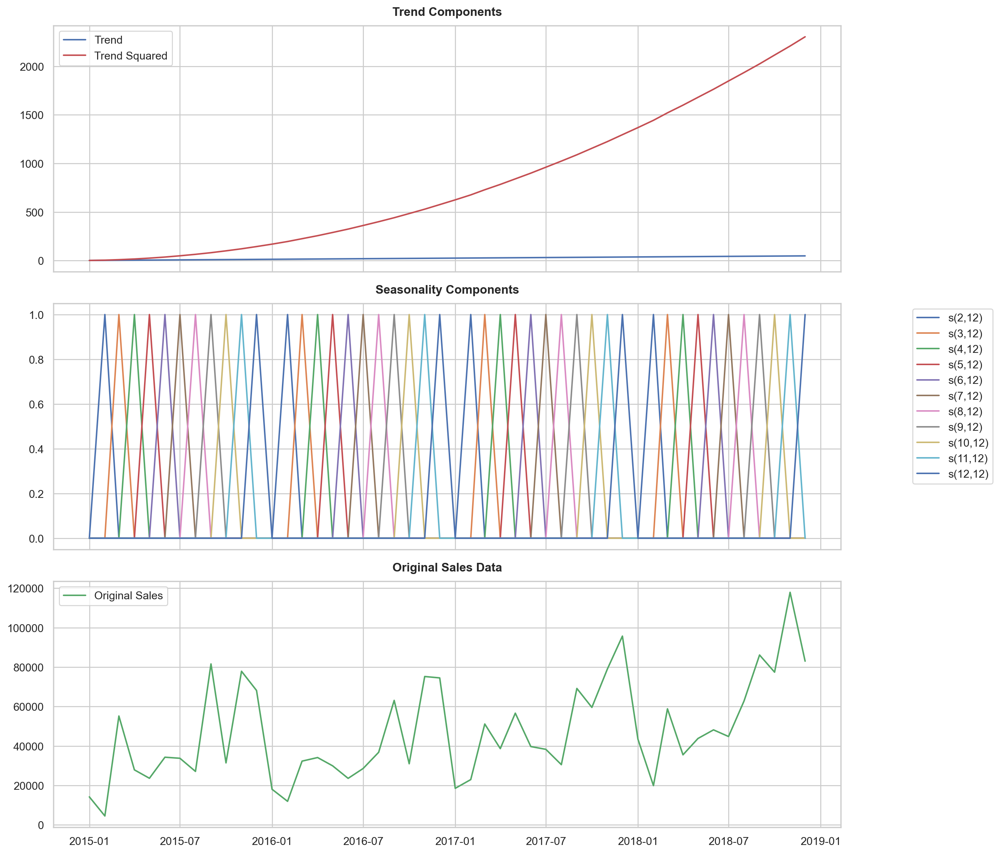

In [27]:
X.index = X.index.to_timestamp()


sns.set(style="whitegrid")
fig, axes = plt.subplots(3, 1, figsize=(14, 12), sharex=True)


axes[0].plot(X.index, X['trend'], label='Trend', color='b')
axes[0].plot(X.index, X['trend_squared'], label='Trend Squared', color='r')
axes[0].set_title('Trend Components')
axes[0].legend()

for col in X.columns[3:]:  # From s(2,12) onwards
    axes[1].plot(X.index, X[col], label=col)
axes[1].set_title('Seasonality Components')
axes[1].legend(loc='upper right', bbox_to_anchor=(1.2, 1))

monthly_sales.index = monthly_sales.index.to_timestamp()  
axes[2].plot(monthly_sales.index, monthly_sales['Sales'], label='Original Sales', color='g')
axes[2].set_title('Original Sales Data')
axes[2].legend()

plt.tight_layout()
plt.savefig('sample data trends&seasonalities',dpi=300)
plt.show()

## train test split

In [29]:
y = monthly_sales['Sales']
X_train= X.loc[:'2017-12']
X_test = X.loc['2018-01':]
y_train = y.loc[:'2017-12']
y_test = y.loc['2018-01':]

## 1.Regression

In [31]:
model = LinearRegression(fit_intercept=False)
model.fit(X_train,y_train)
# pred1 is fitted on X_train, year 2017
y_pred1 = pd.Series(model.predict(X_train), index = X_train.index)
# pred2 is fitted on X_test, year 2018
y_pred2 = pd.Series(model.predict(X_test), index = X_test.index)
# additionally we can tak a look at prediction for year 2019
y_forecast = pd.Series(model.predict(dp.out_of_sample(steps = 12)), index = dp.out_of_sample(steps = 12).index)

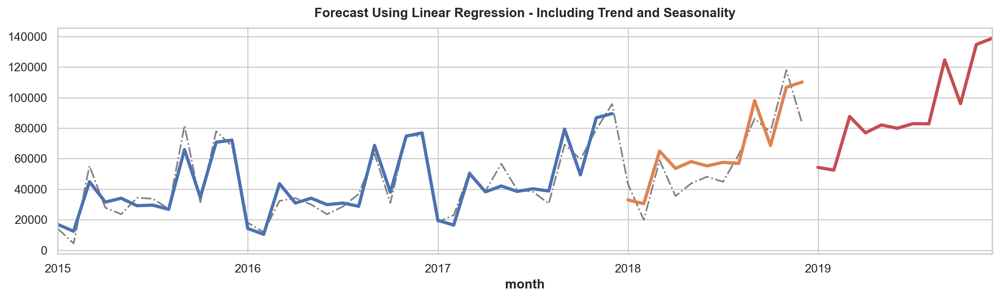

In [32]:
# plot prediction data and compare it with actual train and test data
ax = monthly_sales['Sales'].plot(style="-.", color="0.5", title="Forecast Using Linear Regression - Including Trend and Seasonality")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax =ax, linewidth=3)
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

In [33]:
print('train data: ', r2_score(y_train,y_pred1))
print('test data: ' ,r2_score(y_test, y_pred2))
r_squared_lr = r2_score(y_test,y_pred2)

train data:  0.9105004682072054
test data:  0.73548485583673


## 2.Ada Boost Regressor

In [35]:
ada = AdaBoostRegressor(n_estimators = 40 , estimator = LinearRegression(), loss='square', learning_rate = 0.5, random_state =21)
ada.fit(X_train,y_train)

AdaBoostRegressor(estimator=LinearRegression(), learning_rate=0.5,
                  loss='square', n_estimators=40, random_state=21)

In [36]:
y_pred1 = pd.Series(ada.predict(X_train), index = X_train.index)
y_pred2 = pd.Series(ada.predict(X_test), index = X_test.index)

In [37]:
r_squared_fit = r2_score(y_train,y_pred1)
r_squared_test = r2_score(y_test,y_pred2)
r_squared_ada_boost = r2_score(y_test,y_pred2)
print(r_squared_fit)
print(r_squared_test)

0.9303337615984231
0.7712840424111711


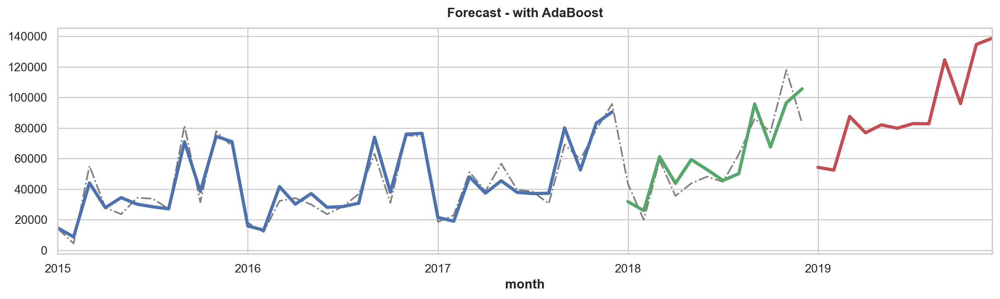

In [38]:
ax = y.plot(style="-.", color="0.5", title="Forecast - with AdaBoost")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

## 3. Random Forest Regressor

In [40]:
rfr = RandomForestRegressor(n_estimators = 50)

In [41]:
rfr.fit(X_train, y_train)

RandomForestRegressor(n_estimators=50)

In [42]:
y_pred1 = pd.Series(rfr.predict(X_train), X_train.index)
y_pred2 = pd.Series(rfr.predict(X_test), X_test.index)
r_squared_fit = r2_score(y_train,y_pred1)
r_squared_test = r2_score(y_test,y_pred2)
r_squared_random_boost = r2_score(y_test,y_pred2)
print(r_squared_fit)
print(r_squared_test)

0.9397539822166361
0.3279353038115439


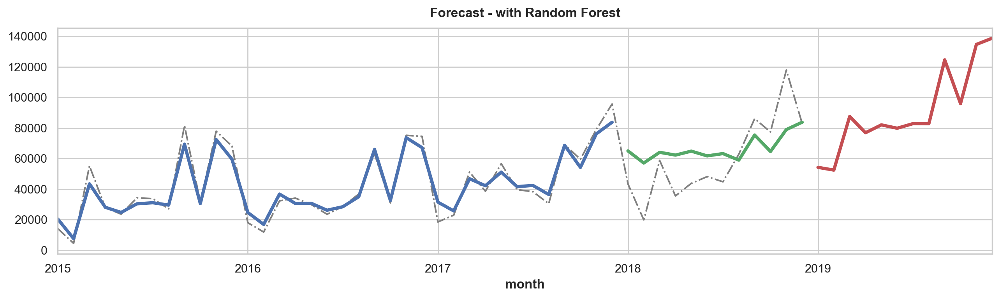

In [43]:
ax = y.plot(style="-.", color="0.5", title="Forecast - with Random Forest")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

## 4.XG Boost Regressor

In [45]:
xgb = XGBRegressor(n_estimators=10000, max_depth=7, eta=0.1, subsample=0.7, colsample_bytree=0.8)

In [46]:
xgb.fit(X_train, y_train)

XGBRegressor(base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=0.8, device=None, early_stopping_rounds=None,
             enable_categorical=False, eta=0.1, eval_metric=None,
             feature_types=None, gamma=None, grow_policy=None,
             importance_type=None, interaction_constraints=None,
             learning_rate=None, max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=7,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=10000,
             n_jobs=None, num_parallel_tree=None, ...)

In [47]:
y_pred1 = pd.Series(xgb.predict(X_train), X_train.index)
y_pred2 = pd.Series(xgb.predict(X_test), X_test.index)
r_squared_fit = r2_score(y_train,y_pred1)
r_squared_test = r2_score(y_test,y_pred2)
r_squared_xgb = r2_score(y_test,y_pred2)
print(r_squared_fit)
print(r_squared_test)

0.9999999999988607
0.1735195391626161


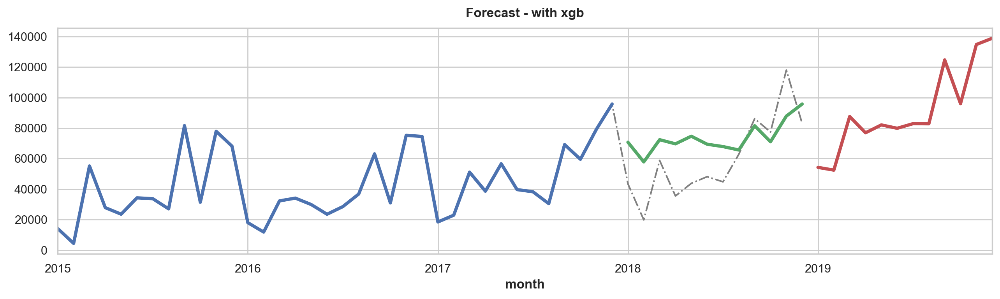

In [48]:
ax = y.plot(style="-.", color="0.5", title="Forecast - with xgb")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

## 5. prophet

In [50]:
# Resample the data to monthly frequency and sum the sales for each month
df2 = pd.read_csv('train_check.csv')
df2['Order Date'] = pd.to_datetime(df2['Order Date'], format='%d/%m/%Y')
monthly_data = df2.resample('ME', on='Order Date').sum()

# Rename columns as 'ds' and 'y' as required by Prophet
monthly_data.reset_index(inplace=True)
monthly_data = monthly_data.rename(columns={'Order Date': 'ds', 'Sales': 'y'})

data_train = monthly_data.iloc[:-12]
data_test = monthly_data.iloc[-12:]


In [51]:
prophet = Prophet(
    seasonality_mode = 'additive',
    seasonality_prior_scale = 10,
    yearly_seasonality=True)
prophet.fit(data_train)

13:33:47 - cmdstanpy - INFO - Chain [1] start processing
13:33:47 - cmdstanpy - INFO - Chain [1] done processing


In [52]:
fitted_y = prophet.predict(data_train)
y_predict = prophet.predict(data_test)

In [53]:
# Extract the actual data and forecast for the next 12 months
actual_data = data_train['y']
y_pred1 = pd.Series(fitted_y['yhat'][:len(monthly_data)].values,X_train.index)  # Fitted values for the historical data
y_pred2 = pd.Series(y_predict['yhat'].values,X_test.index)


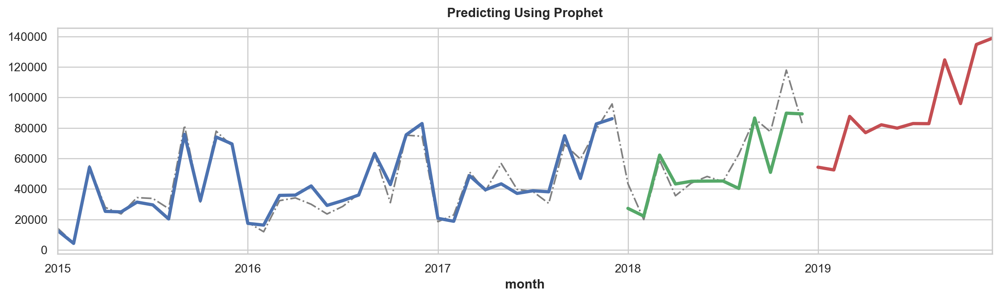

In [54]:
ax = y.plot(style="-.", color="0.5", title="Predicting Using Prophet")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')

In [55]:
print(r2_score(actual_data,y_pred1))
print(r2_score(data_test['y'],y_pred2))
r_squared_prohphet = r2_score(data_test['y'],y_pred2)

0.9386413022918416
0.7001417211475762


## 6.LSTM

In [57]:
class LSTM(nn.Module):
    def __init__(self, input_size = 1, hidden_layer_size = 48, num_layers=3, output_size=1, dropout = 0.0):
        super().__init__()
        self.hidden_layer_size = hidden_layer_size
        self.lstm = nn.LSTM(input_size, hidden_layer_size, num_layers = num_layers)
        self.linear = nn.Linear(hidden_layer_size, output_size)
        
    def forward(self, input_seq):
        lstm_out, _ = self.lstm(input_seq.view(len(input_seq),1,-1))
        predictions = self.linear(lstm_out[:,-1,:])
        return predictions[-1]

In [58]:
model = LSTM()
loss_function = nn.MSELoss()
optimizer = torch.optim.Adam(model.parameters(),lr=0.001)
print(model)

LSTM(
  (lstm): LSTM(1, 48, num_layers=3)
  (linear): Linear(in_features=48, out_features=1, bias=True)
)


In [59]:
#used https://gist.github.com/Lexie88rus/8ab37c8ea8c9f92b0efbca3c584bf063 this as a sample for initializing a custom LSTM

In [60]:
df3 = pd.read_csv('train_check.csv')
df3['Order Date'] = pd.to_datetime(df3['Order Date'], format='%d/%m/%Y')
monthly_data = df3.resample('ME', on='Order Date').sum()

In [61]:
all_data = monthly_data['Sales'].values
train_data = all_data[:-12] 
test_data = all_data[-24:-12]

In [62]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(-1, 1))
train_data_normalized = scaler.fit_transform(train_data.reshape(-1, 1))
test_data_normalized = scaler.transform(test_data.reshape(-1, 1))
train_data_normalized = torch.FloatTensor(train_data_normalized).view(-1)
test_data_normalized = torch.FloatTensor(test_data_normalized).view(-1)

In [63]:
def create_input_sequences(input_data, window):
    inout_seq = []
    L = len(input_data)
    for i in range(L-window):
        train_seq = input_data[i:i+window]
        train_label = input_data[i+window:i+window+1]
        inout_seq.append((train_seq ,train_label))
    return inout_seq

In [64]:
input_seq = create_input_sequences(train_data_normalized,12)

In [65]:
print(input_seq)

[(tensor([-0.7876, -1.0000,  0.1113, -0.4872, -0.5807, -0.3466, -0.3584, -0.5045,
         0.6905, -0.4095,  0.6090,  0.3955]), tensor([-0.7030])), (tensor([-1.0000,  0.1113, -0.4872, -0.5807, -0.3466, -0.3584, -0.5045,  0.6905,
        -0.4095,  0.6090,  0.3955, -0.7030]), tensor([-0.8371])), (tensor([ 0.1113, -0.4872, -0.5807, -0.3466, -0.3584, -0.5045,  0.6905, -0.4095,
         0.6090,  0.3955, -0.7030, -0.8371]), tensor([-0.3901])), (tensor([-0.4872, -0.5807, -0.3466, -0.3584, -0.5045,  0.6905, -0.4095,  0.6090,
         0.3955, -0.7030, -0.8371, -0.3901]), tensor([-0.3503])), (tensor([-0.5807, -0.3466, -0.3584, -0.5045,  0.6905, -0.4095,  0.6090,  0.3955,
        -0.7030, -0.8371, -0.3901, -0.3503]), tensor([-0.4422])), (tensor([-0.3466, -0.3584, -0.5045,  0.6905, -0.4095,  0.6090,  0.3955, -0.7030,
        -0.8371, -0.3901, -0.3503, -0.4422]), tensor([-0.5817])), (tensor([-0.3584, -0.5045,  0.6905, -0.4095,  0.6090,  0.3955, -0.7030, -0.8371,
        -0.3901, -0.3503, -0.4422, -

In [66]:
for i in range(200):
    for seq, labels in input_seq:
        optimizer.zero_grad()
        y_pred = model(seq)
        single_loss = loss_function(y_pred, labels)
        single_loss.backward()
        optimizer.step()
    if i%25 == 1:
        print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')
print(f'epoch: {i:3} loss: {single_loss.item():10.8f}')

epoch:   1 loss: 1.36515701
epoch:  26 loss: 0.51231170
epoch:  51 loss: 0.00001354
epoch:  76 loss: 0.00462032
epoch: 101 loss: 0.02522869
epoch: 126 loss: 0.01219714
epoch: 151 loss: 0.00493994
epoch: 176 loss: 0.00004041
epoch: 199 loss: 0.00010139


In [67]:
test_input = test_data_normalized[-12:].tolist()
model.eval()
for i in range(12):
    seq = torch.FloatTensor(test_input[-12:])
    with torch.no_grad():
        test_input.append(model(seq).item()) 

0.9386413022918416
0.4040717352633909


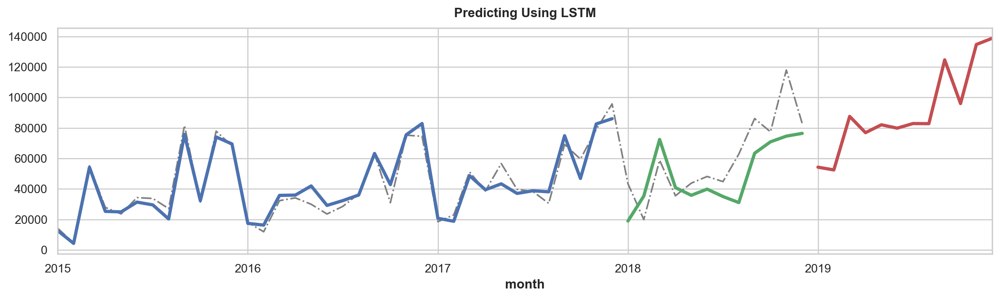

In [68]:
prediction2 =scaler.inverse_transform(np.array(test_input[12:]).reshape(-1, 1))

x = np.arange(len(train_data)+1,len(train_data) + 13,1)
y_pred2 = pd.Series(prediction2[:,0], X_test.index)
ax = y.plot(style="-.", color="0.5", title="Predicting Using LSTM")
ax = y_pred1.plot(ax=ax, linewidth=3, label="Trend")
ax = y_pred2.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C2')
ax = y_forecast.plot(ax=ax, linewidth=3, label="Trend Forecast", color='C3')
print(r2_score(data_train['y'],y_pred1))
print(r2_score(y_test,y_pred2))
r2_score_lstm = r2_score(data_test['y'],y_pred2)

## comparision

In [70]:
scores = [r_squared_lr,r_squared_ada_boost,r_squared_random_boost,r_squared_xgb,r_squared_prohphet,r2_score_lstm]

In [71]:
model_names = ['Linear Regression', 'Ada Boost', 'Random forest', 'XG Boost', 'Prophet', 'LSTM']

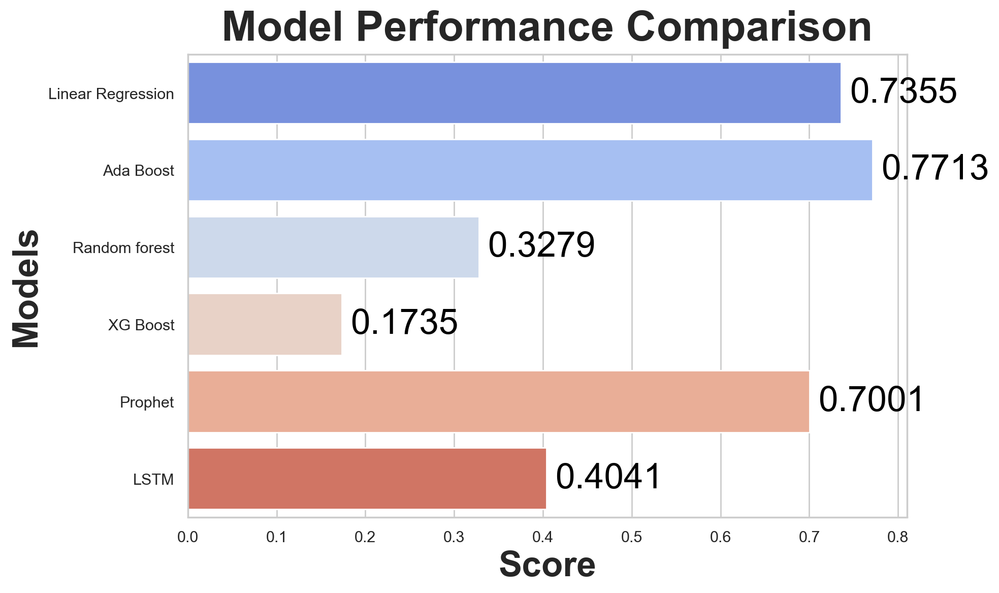

In [72]:
scores_df = pd.DataFrame({
    'Model': model_names,
    'Score': scores
})

sns.set(style="whitegrid")


plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Score', y='Model', data=scores_df, palette='coolwarm')


for index, value in enumerate(scores):
    ax.text(value + 0.01, index, f'{value:.4f}', color='black', va="center", fontsize=25)


plt.title('Model Performance Comparison', fontsize=30)
plt.xlabel('Score', fontsize=25)
plt.ylabel('Models', fontsize=25)

plt.savefig('model_performance_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

## trying the highest accuracy model for other features 

In [74]:
df = pd.read_csv('train_check.csv')
df['Order Date'] = pd.to_datetime(df['Order Date'], format='%d/%m/%Y')
df['month'] = pd.to_datetime(df['Order Date']).dt.to_period('M')

In [75]:

fourier = CalendarFourier(freq = 'ME', order =4)
dp = DeterministicProcess(
    index=df.groupby('month')['Sales'].sum().index,  # dates from the training data
    constant=True,       # dummy feature for the bias (y_intercept)
    order=2,             # the time dummy (trend)
    additional_terms = [fourier],
    seasonal =True,
    drop=True,           # drop terms if necessary to avoid collinearity
)
X = dp.in_sample()

In [76]:
def additional_features_forecast(additional_feature, df,X,scores):
    df_sc = df.groupby(['month'] + additional_feature)['Sales'].sum()
    df_sc = df_sc.reset_index()

    df_sc = df_sc.set_index(['month']+ additional_feature).unstack(additional_feature).fillna(0)
    y = df_sc.loc[:,'Sales']

    X_train= X.loc[:'2017-12']
    X_test = X.loc['2018-01':]
    y_train = y.loc[:'2017-12']
    y_test = y.loc['2018-01':]

    ada = AdaBoostRegressor(n_estimators = 200 , estimator = LinearRegression(), loss='exponential', learning_rate = 0.0001, random_state =21)
    model = MultiOutputRegressor(ada)
    model.fit(X_train,y_train)

    y_fit = pd.DataFrame(model.predict(X_train), index = X_train.index.to_timestamp(),columns = y.columns)
    y_pred = pd.DataFrame(model.predict(X_test), index = X_test.index.to_timestamp(), columns = y.columns)
    fig, axes = plt.subplots(len(y.columns)+1,1, figsize = (12,(len(y.columns)+1)*2), sharex=True, constrained_layout=True)
    
    fig.suptitle('Sales Forecast for Each {}'.format(additional_feature[0]), fontsize=20, color='blue')

    for ax, feature in zip(axes, y.columns):
        ax.plot(y.index.to_timestamp(), y[feature], color="0.5", linestyle='dashed')
        ax.plot(y_fit[feature])
        ax.plot(y_pred[feature])
        ax.set_title(f'{feature}, test accuracy: {r2_score(y_test[feature],y_pred[feature]):.2f}', fontsize=10)

    axes[-1].plot(y.index.to_timestamp(), y.sum(axis=1), color="0.5", linestyle='dashed')
    axes[-1].plot(y_fit.sum(axis=1))
    axes[-1].plot(y_pred.sum(axis=1))
    scores.append(r2_score(y_test.sum(axis=1),y_pred.sum(axis=1)))
    axes[-1].set_title(f'Sum of all {additional_feature[0]}, test accuracy: {r2_score(y_test.sum(axis=1),y_pred.sum(axis=1)):.2f}', 
                       fontsize=12, color='green')
    plt.savefig(f'Sum of all {additional_feature[0]}',dpi=300)
    plt.show()

In [77]:
features = ['Category', 'Segment','Region','Sub-Category','State','Ship Mode']
scores = []

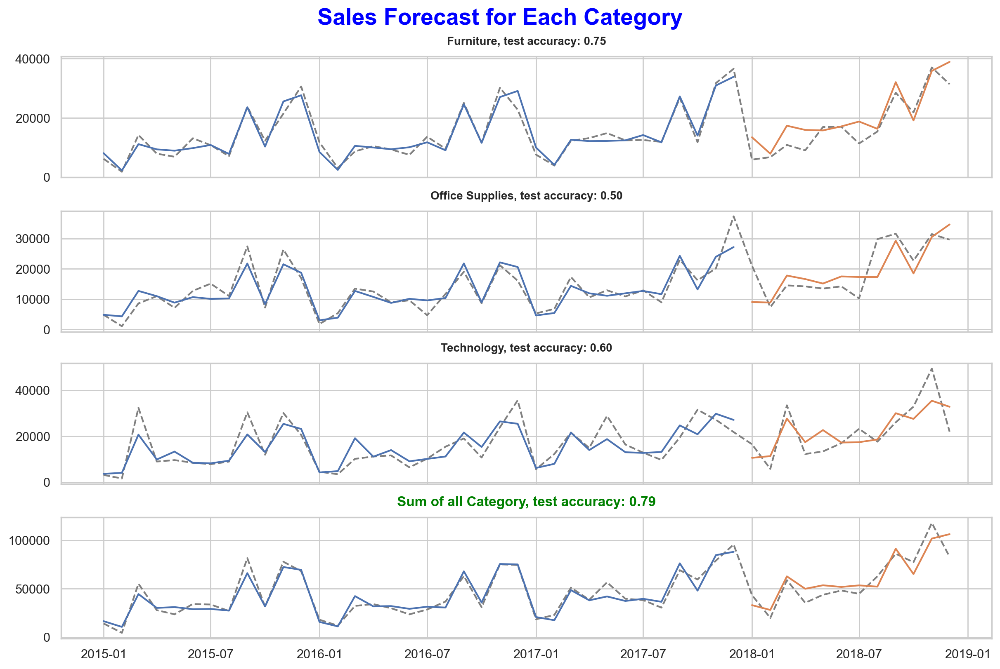

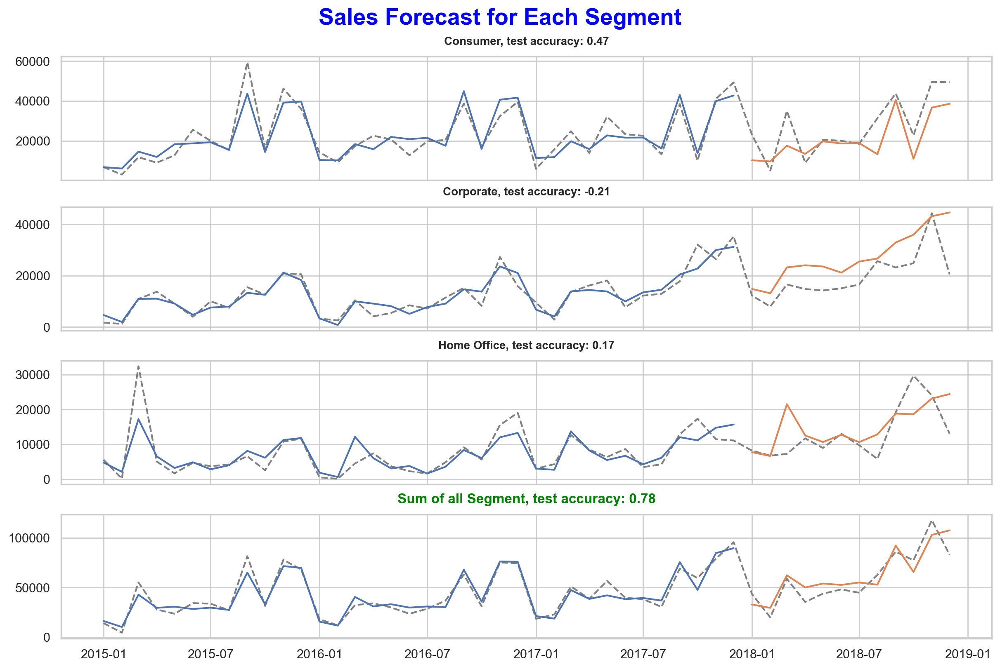

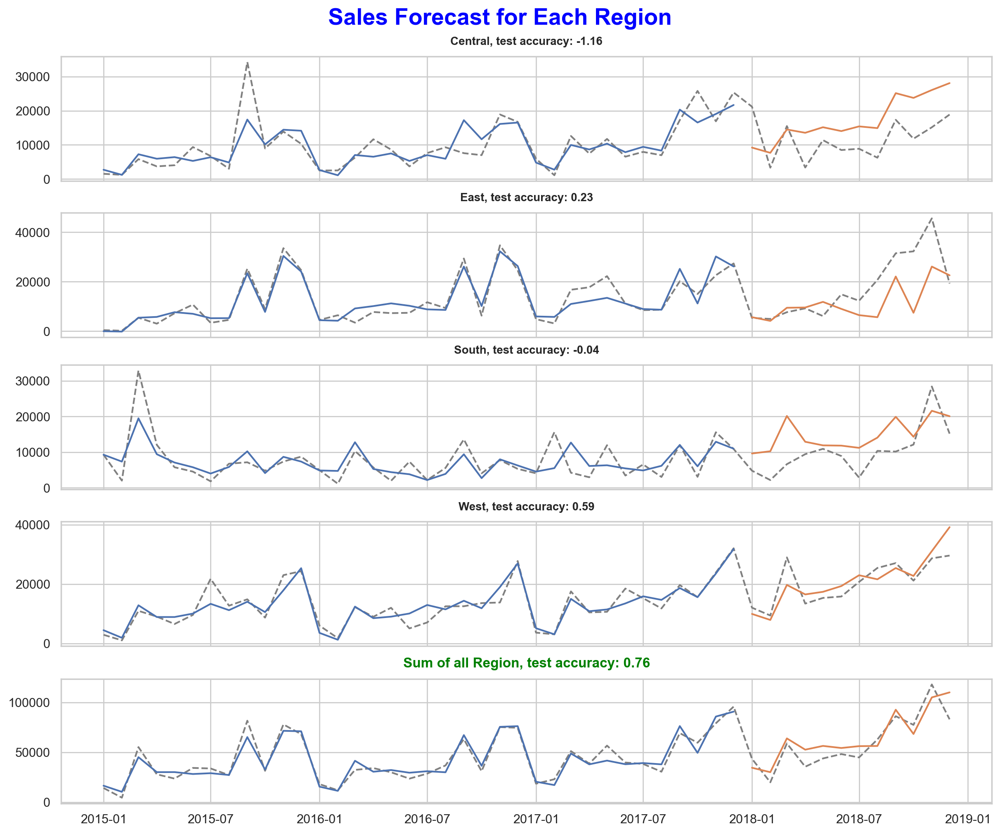

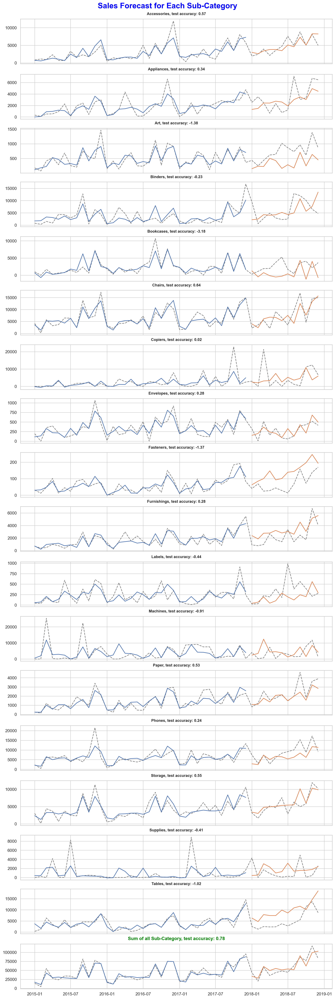

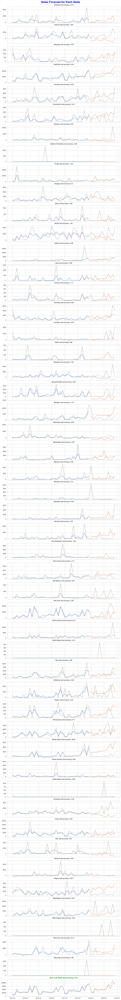

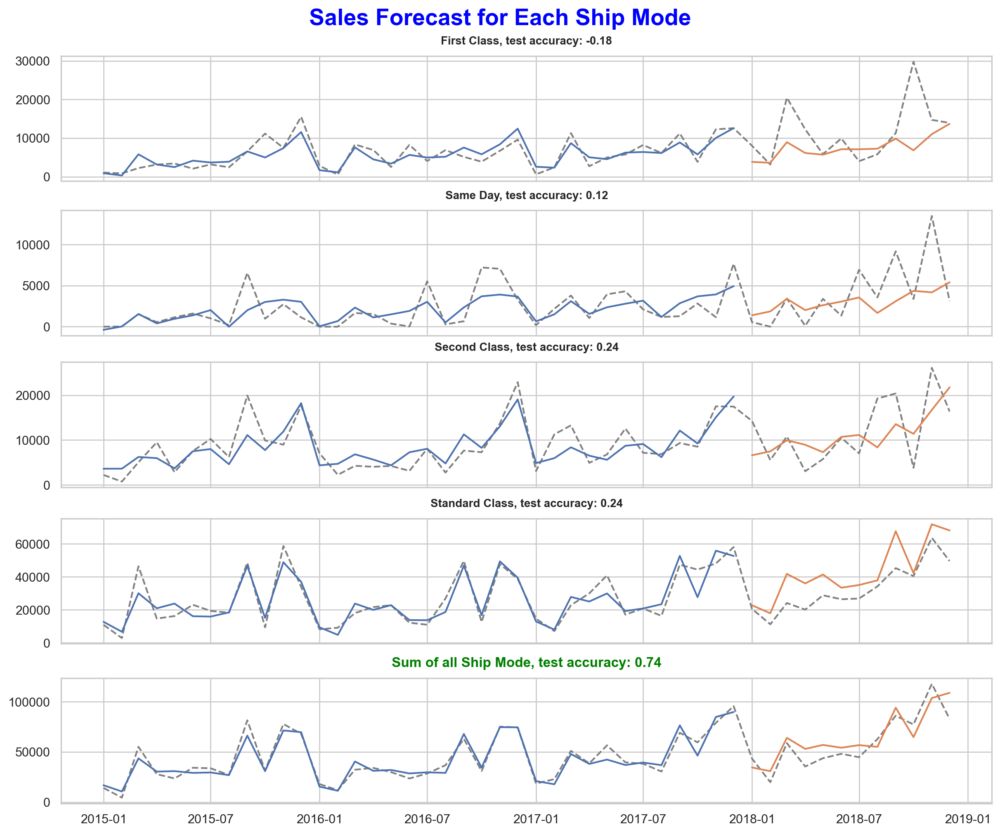

In [78]:
for feature_ in features:
    additional_features_forecast([feature_],df,X,scores)


In [79]:
scores

[0.7899571977612798,
 0.779416367974549,
 0.7639232422955751,
 0.7840890520616858,
 0.7331317068253601,
 0.7438488899422415]

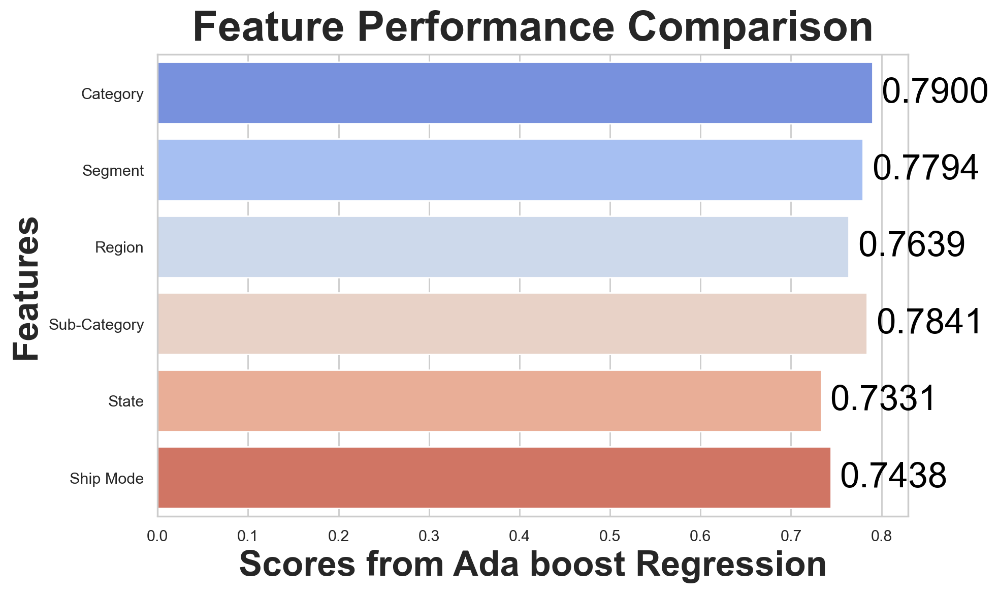

In [80]:
scores_df = pd.DataFrame({
    'Feature': features,
    'Score': scores
})

sns.set(style="whitegrid")

plt.figure(figsize=(10, 6))
ax = sns.barplot(x='Score', y='Feature', data=scores_df, palette='coolwarm')

for index, value in enumerate(scores):
    ax.text(value + 0.01, index, f'{value:.4f}', color='black', va="center", fontsize=25)

plt.title('Feature Performance Comparison', fontsize=30)
plt.xlabel('Scores from Ada boost Regression', fontsize=25)
plt.ylabel('Features', fontsize=25)

plt.savefig('feature_performance_comparison.png', dpi=300, bbox_inches='tight')
plt.show()

## combining all the features

In [82]:
def additional_features_forecast_single(df, X):
    df_sc = df.groupby(['month'])['Sales'].sum()  
    df_sc = df_sc.reset_index()

    df_sc = df_sc.set_index('month').fillna(0)
    y = df_sc['Sales']  # This is a single output

    X_train = X.loc[:'2017-12']
    X_test = X.loc['2018-01':]
    y_train = y.loc[:'2017-12']
    y_test = y.loc['2018-01':]

    # Check for NaN or Infinite values
    if X_train.isnull().values.any() or X_test.isnull().values.any():
        print("NaN values found in the features!")
        return

    if y_train.isnull().values.any() or y_test.isnull().values.any():
        print("NaN values found in the target!")
        return

    # Ensure types are correct
    X_train = X_train.astype(float)
    X_test = X_test.astype(float)
    y_train = y_train.astype(float)
    y_test = y_test.astype(float)

    ada = AdaBoostRegressor(n_estimators=200, estimator=LinearRegression(), loss='exponential', learning_rate=0.0001, random_state=21)

    try:
        ada.fit(X_train, y_train)
    except ValueError as e:
        print(f"Error fitting the model: {e}")
        return

    y_fit = pd.DataFrame(ada.predict(X_train), index=X_train.index, columns=['Sales'])  # Use the index of X_train
    y_pred = pd.DataFrame(ada.predict(X_test), index=X_test.index, columns=['Sales'])  # Use the index of X_test

    
    sum_r2 = r2_score(y_test, y_pred)
    scores.append(sum_r2)

    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(y.index.to_timestamp(), y, color="0.5", linestyle='dashed', label='Actual Sales')
    ax.plot(y_fit.index.to_timestamp(), y_fit, label='Fitted Sales', color='blue')
    ax.plot(y_pred.index.to_timestamp(), y_pred, label='Predicted Sales', color='orange')
    ax.set_title(f'Overall Sales Forecast for Ada boost, Test Accuracy: {sum_r2:.2f}', fontsize=16)
    ax.legend()
    plt.show()



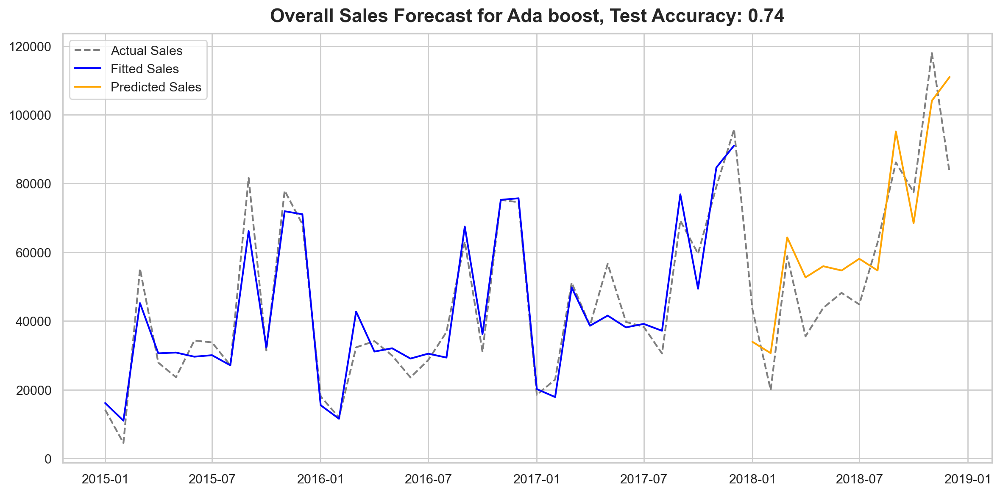

In [83]:
additional_features_forecast_single(df, X)

In [84]:
def additional_features_forecast_single(df, X):
    df_sc = df.groupby(['month'])['Sales'].sum()  
    df_sc = df_sc.reset_index()

    df_sc = df_sc.set_index('month').fillna(0)
    y = df_sc['Sales']  # This is a single output

    X_train = X.loc[:'2017-12']
    X_test = X.loc['2018-01':]
    y_train = y.loc[:'2017-12']
    y_test = y.loc['2018-01':]

    # Check for NaN or Infinite values
    if X_train.isnull().values.any() or X_test.isnull().values.any():
        print("NaN values found in the features!")
        return

    if y_train.isnull().values.any() or y_test.isnull().values.any():
        print("NaN values found in the target!")
        return

    # Ensure types are correct
    X_train = X_train.astype(float)
    X_test = X_test.astype(float)
    y_train = y_train.astype(float)
    y_test = y_test.astype(float)

    lr = LinearRegression()

    try:
        lr.fit(X_train, y_train)
    except ValueError as e:
        print(f"Error fitting the model: {e}")
        return

    y_fit = pd.DataFrame(ada.predict(X_train), index=X_train.index, columns=['Sales'])  # Use the index of X_train
    y_pred = pd.DataFrame(ada.predict(X_test), index=X_test.index, columns=['Sales'])  # Use the index of X_test

    
    sum_r2 = r2_score(y_test, y_pred)
    scores.append(sum_r2)

    
    fig, ax = plt.subplots(figsize=(12, 6))
    ax.plot(y.index.to_timestamp(), y, color="0.5", linestyle='dashed', label='Actual Sales')
    ax.plot(y_fit.index.to_timestamp(), y_fit, label='Fitted Sales', color='blue')
    ax.plot(y_pred.index.to_timestamp(), y_pred, label='Predicted Sales', color='orange')
    ax.set_title(f'Overall Sales Forecast for Linear Regression, Test Accuracy: {sum_r2:.2f}', fontsize=16)
    ax.legend()
    plt.show()



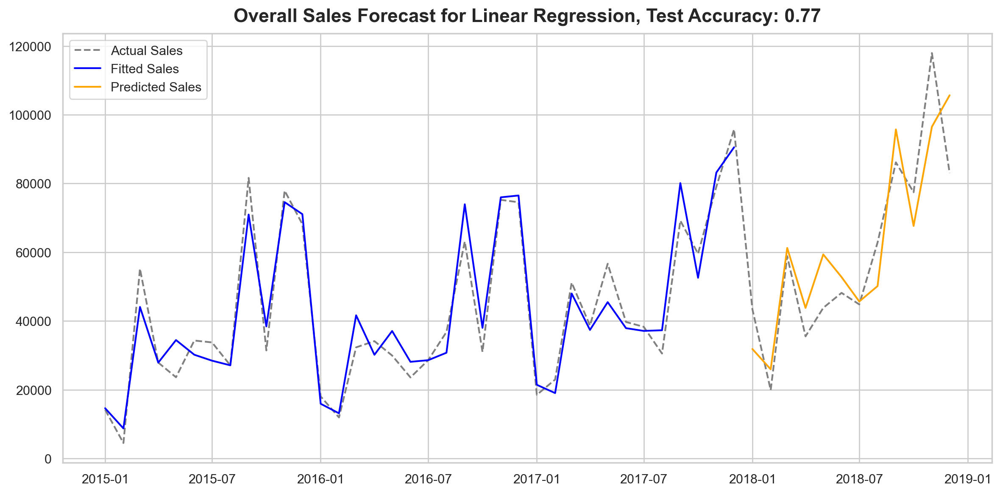

In [85]:
additional_features_forecast_single(df, X)